In [ ]:
# update gdown for compatibility issue. 2022/12/12
!pip install --upgrade gdown

In [ ]:
import os

#day train:
#https://drive.google.com/file/d/1vTkyoQkJ13TuufkjO98Pg4q-aw2Zx5N5/view?usp=share_link
#day val:
#https://drive.google.com/file/d/1LxQ9LTaaHBdMkO9hY-mdvYATf9_J9olx/view?usp=share_link
#night train:
#https://drive.google.com/file/d/1pArk8JUYPc520Oalm7bMhprIxBu3IRou/view?usp=share_link
#night val:
#https://drive.google.com/file/d/1BV5ez0EhC8xjP329vmyKLmukdZk3kgfU/view?usp=share_link


os.system("gdown https://drive.google.com/uc?id=1vTkyoQkJ13TuufkjO98Pg4q-aw2Zx5N5")
os.system("gdown https://drive.google.com/uc?id=1LxQ9LTaaHBdMkO9hY-mdvYATf9_J9olx")
os.system("gdown https://drive.google.com/uc?id=1pArk8JUYPc520Oalm7bMhprIxBu3IRou")
os.system("gdown https://drive.google.com/uc?id=1BV5ez0EhC8xjP329vmyKLmukdZk3kgfU")

os.system("unzip CycleEDA_bdd100k_day_train.zip")
os.system("unzip CycleEDA_bdd100k_day_val.zip")
os.system("unzip CycleEDA_bdd100k_night_train.zip")
os.system("unzip CycleEDA_bdd100k_night_val.zip")

os.remove("CycleEDA_bdd100k_day_train.zip")
os.remove("CycleEDA_bdd100k_day_val.zip")
os.remove("CycleEDA_bdd100k_night_train.zip")
os.remove("CycleEDA_bdd100k_night_val.zip")

In [ ]:
%ls
%cd ./content
%ls


CycleEDA_bdd100k_day_train/  CycleEDA_bdd100k_night_train/  sample_data/
CycleEDA_bdd100k_day_val/    CycleEDA_bdd100k_night_val/
[Errno 2] No such file or directory: './content'
/content
CycleEDA_bdd100k_day_train/  CycleEDA_bdd100k_night_train/  sample_data/
CycleEDA_bdd100k_day_val/    CycleEDA_bdd100k_night_val/


In [ ]:
import shutil

os.makedirs('bdd100k_dataset')
#os.makedirs('bdd100k_dataset/valAB') # later be used for predict.sh

shutil.move('./CycleEDA_bdd100k_day_train','bdd100k_dataset/')
shutil.move('./CycleEDA_bdd100k_night_train','bdd100k_dataset/')

shutil.move('./CycleEDA_bdd100k_day_val','bdd100k_dataset/')
shutil.move('./CycleEDA_bdd100k_night_val','bdd100k_dataset/')

os.rename('bdd100k_dataset/CycleEDA_bdd100k_day_train/', 'bdd100k_dataset/trainA/')
os.rename('bdd100k_dataset/CycleEDA_bdd100k_night_train/', 'bdd100k_dataset/trainB/')
os.rename('bdd100k_dataset/CycleEDA_bdd100k_day_val/', 'bdd100k_dataset/valA/')
os.rename('bdd100k_dataset/CycleEDA_bdd100k_night_val/', 'bdd100k_dataset/valB/')


In [ ]:
!git clone https://github.com/bjc1999/CyEDA.git

Cloning into 'CyEDA'...
remote: Enumerating objects: 83, done.
remote: Counting objects: 100% (19/19), done.
remote: Compressing objects: 100% (19/19), done.
remote: Total 83 (delta 9), reused 0 (delta 0), pack-reused 64
Receiving objects: 100% (83/83), 130.13 MiB | 28.99 MiB/s, done.
Resolving deltas: 100% (24/24), done.
Updating files: 100% (36/36), done.


In [ ]:
%cd CyEDA
!ls

/content/CyEDA
data  LICENSE  options	   predict.sh  README.md	train.py  util
imgs  models   predict.py  pretrain    requirement.txt	train.sh


In [ ]:
!sh train.sh

------------ Options -------------
batchSize: 2
beta1: 0.5
checkpoints_dir: ./checkpoints
continue_train: False
cycle_loss: Edge
dataroot: ../bdd100k_dataset
dataset_mode: unaligned
display_freq: 30
display_id: 0
display_port: 8097
display_single_pane_ncols: 0
display_winsize: 256
fineSize: 256
gpu_ids: [0]
input_nc: 3
isTrain: True
lambda_A: 10.0
lambda_B: 10.0
lambda_cycle: 3.0
loadSize: 286
lr: 0.0001
max_dataset_size: inf
model: cycle_gan
nThreads: 4
n_layers_D: 5
n_mask: 3
name: experimentA
ndf: 64
ngf: 64
niter: 10
niter_decay: 10
no_dropout: True
no_flip: True
no_lsgan: False
norm: instance
output_nc: 3
phase: train
pool_size: 50
print_freq: 100
resize_or_crop: resize
save_epoch_freq: 1
save_latest_freq: 5000
serial_batches: False
skip: 1.0
tanh: True
which_direction: AtoB
which_epoch: latest
which_model_netD: no_norm
which_model_netG: sid_unet_resize
-------------- End ----------------
CustomDatasetDataLoader
dataset [UnalignedDataset] was created
/usr/local/lib/python3.10/dist

result of epoch-9


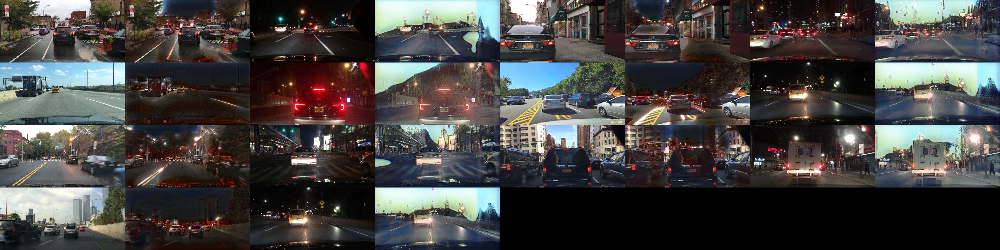

result of epoch-12


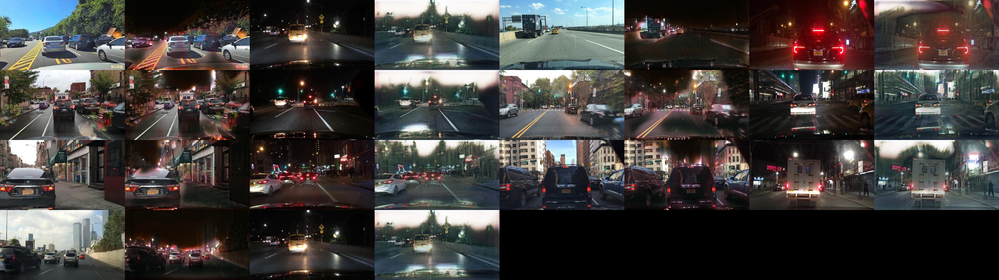

In [ ]:
# Let's show some validation images.
# Do remember the result deivation is quite significant from epoch to epoch!

from google.colab.patches import cv2_imshow
import cv2
print('result of epoch-9')
img = cv2.imread('/content/CyEDA/checkpoints/experimentA/web/images/epoch009_val.jpg', cv2.IMREAD_UNCHANGED)
cv2_imshow(img)

print('result of epoch-12')
img = cv2.imread('/content/CyEDA/checkpoints/experimentA/web/images/epoch012_val.jpg', cv2.IMREAD_UNCHANGED)
cv2_imshow(img)

result of epoch-20


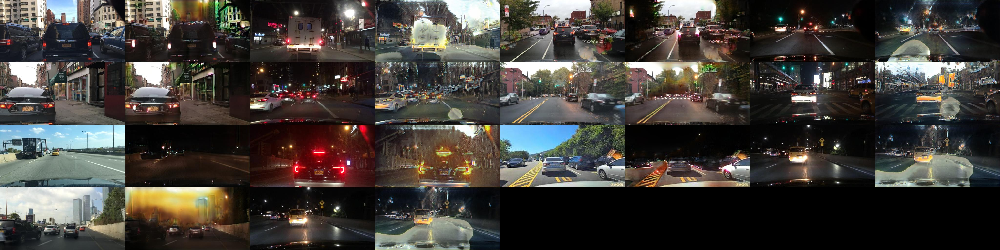

In [ ]:
print('result of epoch-20')
img = cv2.imread('/content/CyEDA/checkpoints/experimentA/web/images/epoch020_val.jpg', cv2.IMREAD_UNCHANGED)
cv2_imshow(img)